## Single cell RNAseq Cell annotation

Annotating cell types in scRNAseq is challenging. But first let's compare it to FACS (Fluorescence-activated cell sorting) which is a technique used to sort a heterogeneous mixture of cells into subpopulations based on the presence or absence of specific cell surface markers. FACS is a powerful tool for isolating specific cell types for downstream analysis, but it requires prior knowledge of cell surface markers and is limited to known cell types.

In contrast, scRNA-seq allows for unbiased and comprehensive profiling of gene expression in individual cells, enabling the discovery of novel cell types and states. However, annotating cell types in scRNA-seq data can be challenging due to the high dimensionality of the data, the presence of rare cell types, and the lack of well-defined markers for some cell types.

There are databases with marker genes for manual annotation, e.g. CellMarker Other option is automated cell tpe annotation.


### From Single cell best practices

https://www.sc-best-practices.org/cellular_structure/annotation.html

>To understand your data better and make use of existing knowledge, it is important to figure out the “cellular identity” of each of the cells in your data. The process of labeling groups of cells in your data based on known (or sometimes unknown) cellular phenotypes is called “cell annotation”. Whereas there are many ways to annotate your cells (e.g. based on batch, disease, sex and more), in this notebook we will focus on the annotation of “cell types”.

>So how do we go about annotating cells in single-cell data? There are multiple ways to do it and we will give an overview of different approaches below. As we are working with transcriptomic data, each of these methods is ultimately based on the expression of specific genes or gene sets, or general transcriptomic similarity between cells.

In [3]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import scarches as sca
import urllib.request

warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
sc.set_figure_params(figsize=(5, 5))




### From markers to cluster annotation

Marker based approach uses prior knowledge based on literature and previous studies. Again from [Single cell best practices](https://www.sc-best-practices.org/cellular_structure/annotation.html):

>Let’s get started with the known-marker based approach. We will first list a set of markers for cell types in the bone marrow here that is based on literature: previous papers that study specific cell types and subtypes and report marker genes for those cell types. Note that markers at the protein level (e.g. used for FACS) sometimes do not work as well in transcriptomic data, hence using markers from RNA-based papers is often more likely to work. Moreover, sometimes markers in one dataset do not turn out to work as well in other datasets. Ideally a marker set is therefore validated across multiple datasets. Finally, it is often useful to work together with experts: as a bioinformatician, try to team up with a biologist who has more extensive knowledge of the tissue, the biology, the expected cell types and markers etc.

In [4]:
adata = sc.read(
    filename="s4d8_clustered.h5ad",
    backup_url="https://figshare.com/ndownloader/files/41436666",
)

100%|██████████| 2.23G/2.23G [11:36<00:00, 3.44MB/s] 


In [5]:
adata.var.shape


(31208, 14)

In [6]:
#manual curation of marker genes


marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [7]:
#subset ot markers in the dataset
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found
import pprint

pprint.pprint(marker_genes_in_data)

{'B1 B': ['MS4A1',
          'SSPN',
          'ITGB1',
          'EPHA4',
          'COL4A4',
          'PRDM1',
          'IRF4',
          'CD38',
          'XBP1',
          'PAX5',
          'BCL11A',
          'BLK',
          'IGHD',
          'IGHM',
          'ZNF215'],
 'CD14+ Mono': ['FCN1', 'CD14'],
 'CD16+ Mono': ['TCF7L2', 'FCGR3A', 'LYN'],
 'CD4+ T activated': ['CD4', 'IL7R', 'TRBC2', 'ITGB1'],
 'CD4+ T naive': ['CD4', 'IL7R', 'TRBC2', 'CCR7'],
 'CD8+ T': ['CD8A', 'CD8B', 'GZMK', 'GZMA', 'CCL5', 'GZMB', 'GZMH', 'GZMA'],
 'Erythroblast': ['MKI67', 'HBA1', 'HBB'],
 'G/M prog': ['MPO', 'BCL2', 'KCNQ5', 'CSF3R'],
 'HSC': ['NRIP1', 'MECOM', 'PROM1', 'NKAIN2', 'CD34'],
 'ID2-hi myeloid prog': ['CD14',
                         'ID2',
                         'VCAN',
                         'S100A9',
                         'CLEC12A',
                         'KLF4',
                         'PLAUR'],
 'ILC': ['ID2', 'PLCG2', 'GNLY', 'SYNE1'],
 'Lymph prog': ['VPREB1',
       

>To see where these markers are expressed we can work with a 2-dimensional visualization of the data, such as a UMAP. We’ll construct that UMAP here based on the scran-normalized count data, using only the highly deviant genes. Note that we first perform a PCA on the normalized counts to reduce dimensionality of the data before we generate the UMAP.

>To start we store our raw counts in .layers['counts'], so that we will still have access to them later if needed. We then set our adata.X to the scran-normalized, log-transformed counts.


>We furthermore set our adata.var.highly_variable to the highly deviant genes. Scanpy uses this var column in downstream calculations, such as the PCA below


>Now perform PCA. We use the highly deviant genes (set as “highly variable” above) to reduce noise and strengthen signal in our data and set number of components to the default n=50. 50 is on the high side for data of a single sample, but it will ensure that we don’t ignore important variation in our data.



In [8]:
adata.layers["counts"] = adata.X
adata.X = adata.layers["scran_normalization"]

adata.var["highly_variable"] = adata.var["highly_deviant"]


sc.tl.pca(adata, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Now show expression of the markers using the calculated UMAP. We’ll limit ourselves to B/plasma cell subtypes for this example. Note from the marker dictionary above that there are three negative markers in our list: IGHD and IGHM for B1 B, and PAX5 for plasmablasts, or meaning that this cell type is expected not to or to lowly express those markers.

Let’s list the B cell subtypes we want to show the markers for:

NAIVE CD20+ B:


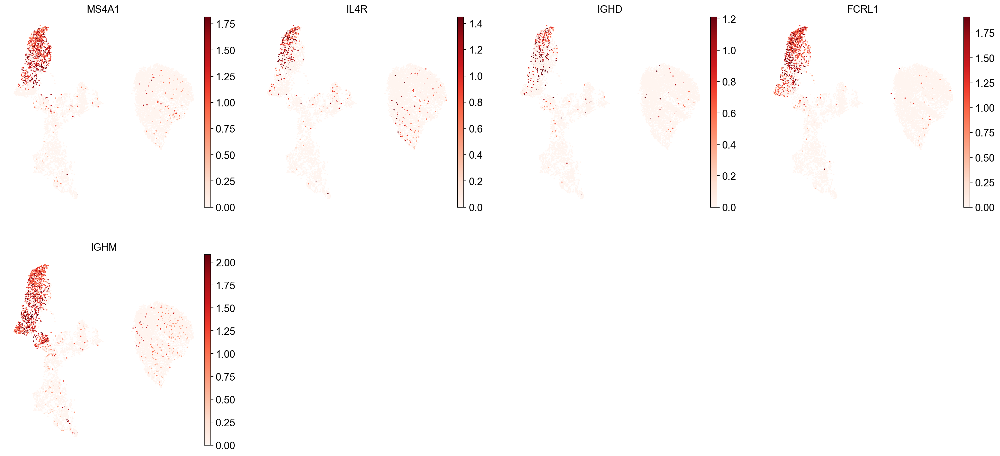





B1 B:


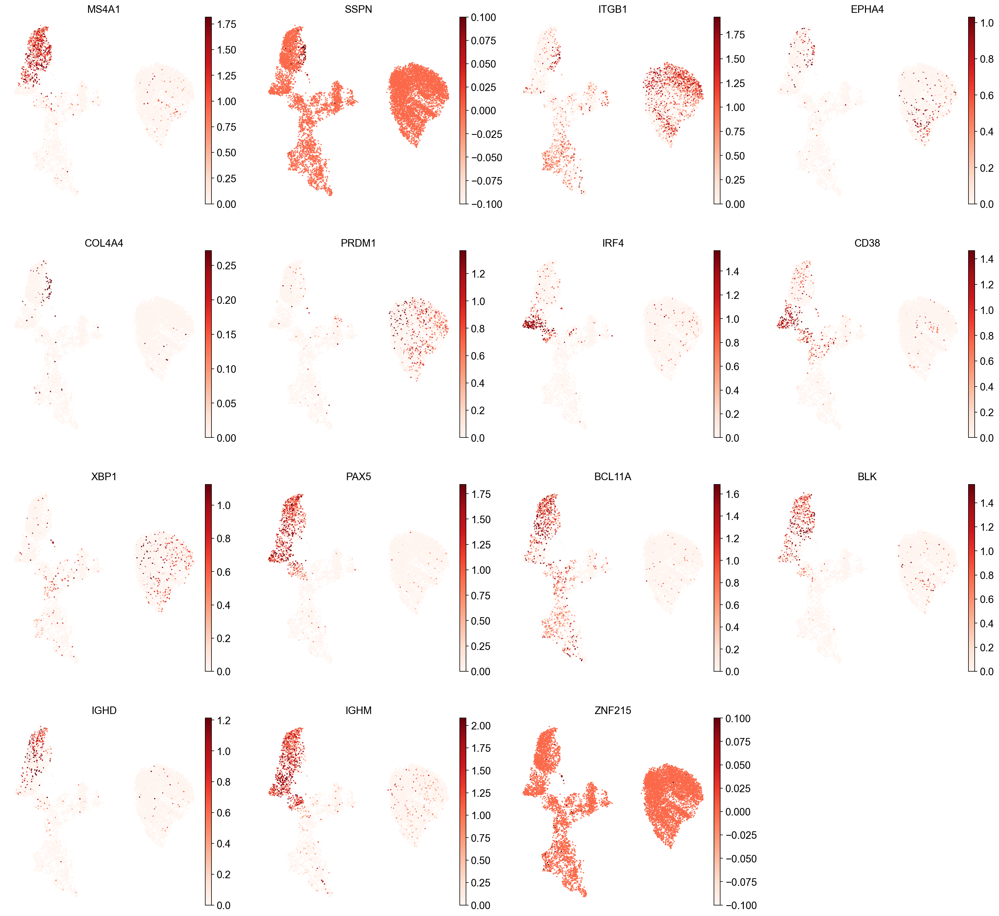





TRANSITIONAL B:


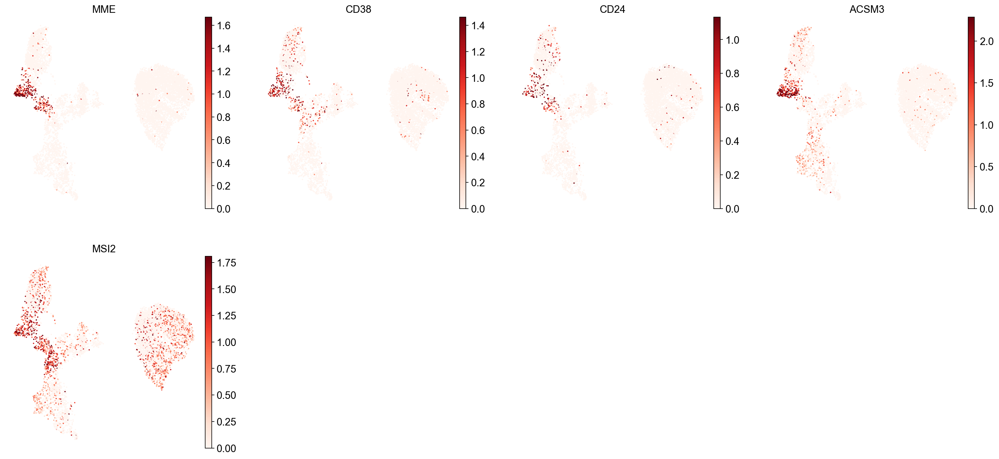





PLASMA CELLS:


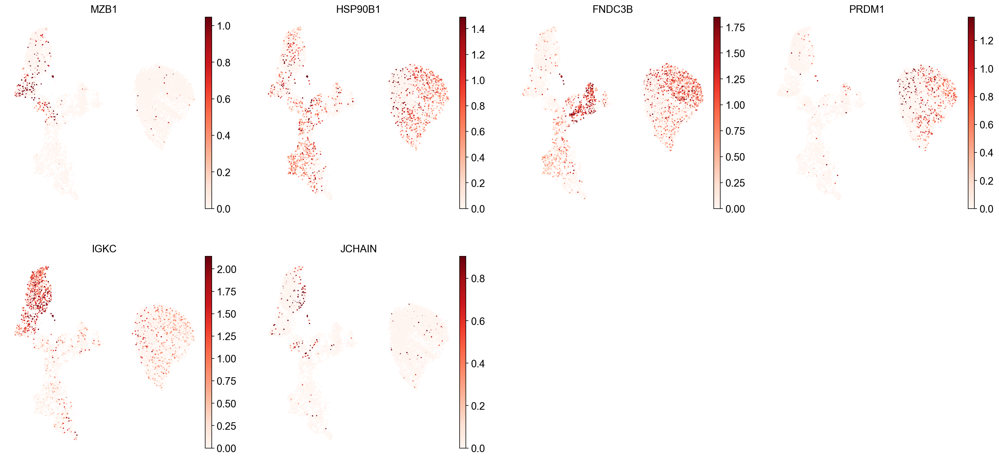





PLASMABLAST:


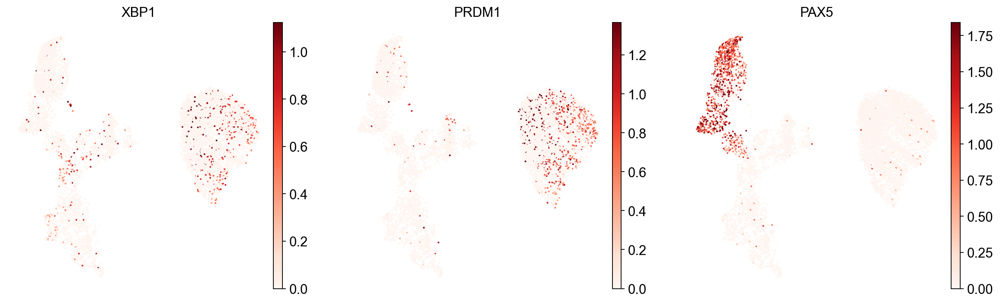

In [10]:
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]


# plot the marker genes for each cell type in UMAP
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

Again from [Single cell best practices](https://www.sc-best-practices.org/cellular_structure/annotation.html):

>As you can see, even markers for a single cell type are often expressed in different subsets of the data, i.e. individual markers are often not uniquely expressed in a single cell type. Rather, it is the intersection of those subsets that will tell you where your cell type of interest is.

>Another thing you might notice is that markers are often sparsely expressed, i.e. it is often only a subset of cells of a cell type in which a marker was detected. This is due to the nature of scRNA-seq data: we only sequence a small subset of the total amount of RNA molecules in the cell and due to this subsampling we will sometimes not sample transcripts from specific genes in a cell even if they were expressed in that cell. Therefore, we do not annotate single cells based on a minimum expression threshold of e.g. a set of markers. Instead, we first subdivide the data into groups of similar cells (i.e. “partition” the data) by clustering, thereby accounting for “missing transcripts” of single genes and rather grouping based on overall transcriptomic similarity. We can then annotate those clusters based on their overall marker expression patterns.

>Let us cluster our data now. We will use the Leiden algorithm [Traag et al., 2019] as discussed in the Clustering chapter to define a grouping of our data into similar subsets of cells:

To be clear, we have projeject the data into a lower dimensional space using PCA and UMAP and Leiden clusters the cells in UMAP space.

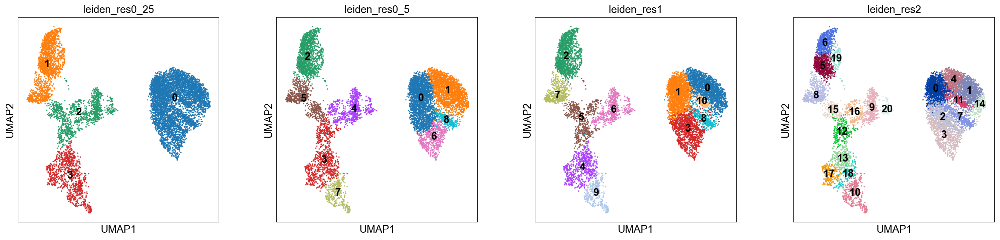

In [11]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25, )
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5 )
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)
sc.tl.leiden(adata, key_added="leiden_res2", resolution=2.0)

sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1", "leiden_res2"],
    legend_loc="on data",
)

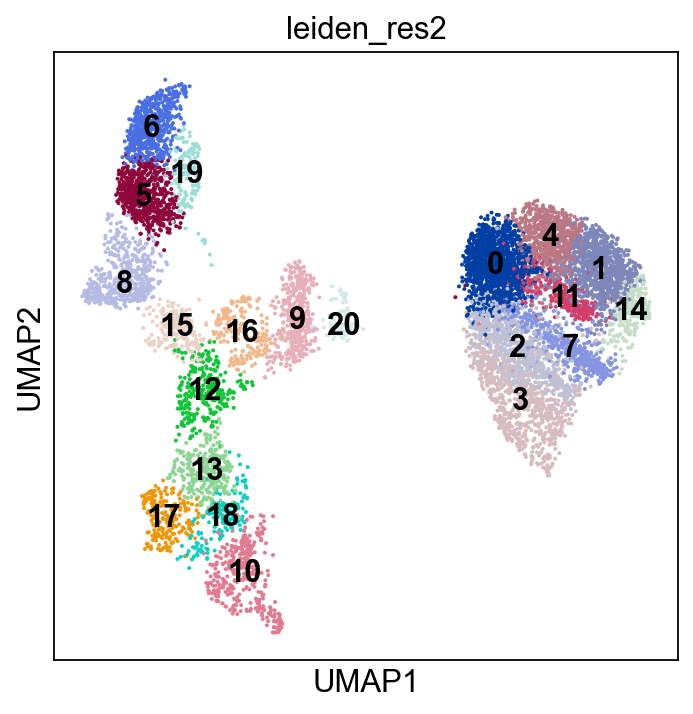

In [12]:
sc.pl.umap(adata, color="leiden_res2", legend_loc="on data")


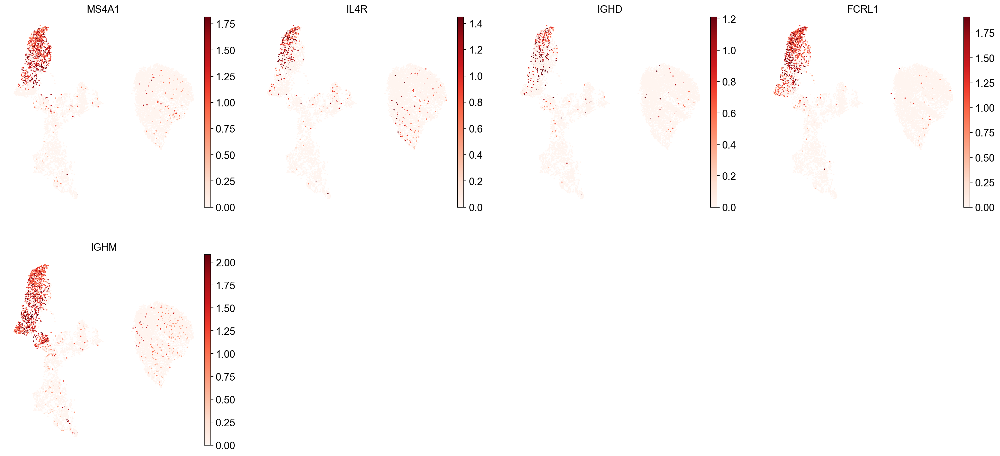

In [13]:
sc.pl.umap(
        adata,
        color=marker_genes_in_data['Naive CD20+ B'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

In [14]:
B_plasma_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts
}

B_plasma_markers

{'Naive CD20+ B': ['MS4A1', 'IL4R', 'IGHD', 'FCRL1', 'IGHM'],
 'B1 B': ['MS4A1',
  'SSPN',
  'ITGB1',
  'EPHA4',
  'COL4A4',
  'PRDM1',
  'IRF4',
  'CD38',
  'XBP1',
  'PAX5',
  'BCL11A',
  'BLK',
  'IGHD',
  'IGHM',
  'ZNF215'],
 'Transitional B': ['MME', 'CD38', 'CD24', 'ACSM3', 'MSI2'],
 'Plasma cells': ['MZB1', 'HSP90B1', 'FNDC3B', 'PRDM1', 'IGKC', 'JCHAIN'],
 'Plasmablast': ['XBP1', 'PRDM1', 'PAX5']}

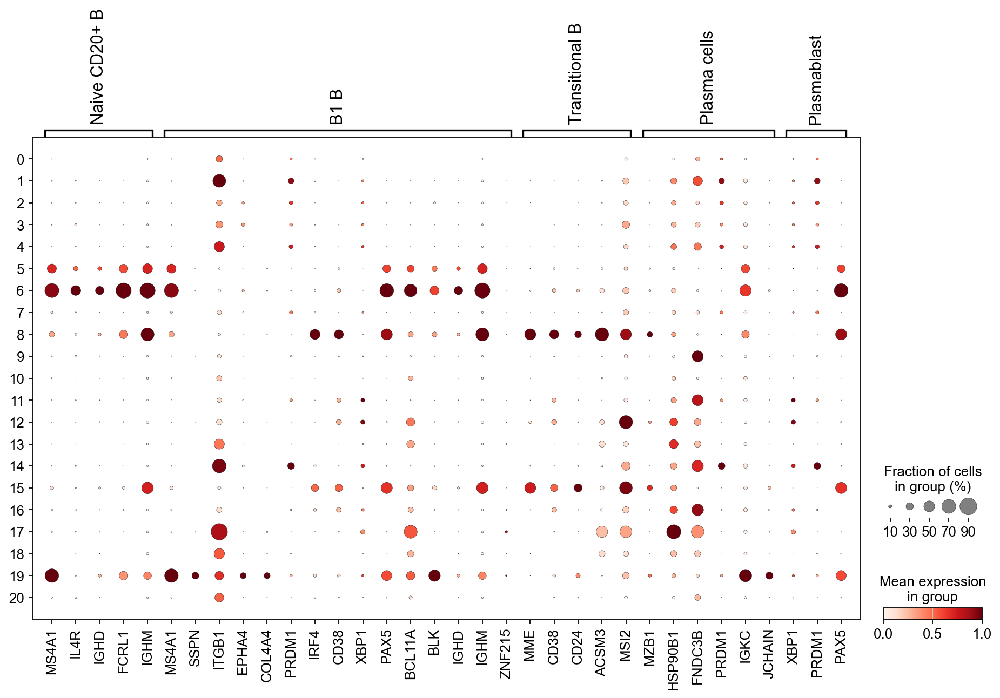

In [15]:
sc.pl.dotplot(
    adata,
    groupby="leiden_res2",
    var_names=B_plasma_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

Visually inspecting the dotplot and UMAP, we can annotate the clusters.  But B1 B is not straightforward because it's not a clear cut decison with none of the markers expressing all the markers and some of the clusters expressing some of the markers. This can be due to biological reasons or technical reasons like dropouts.




... storing 'manual_celltype_annotation' as categorical


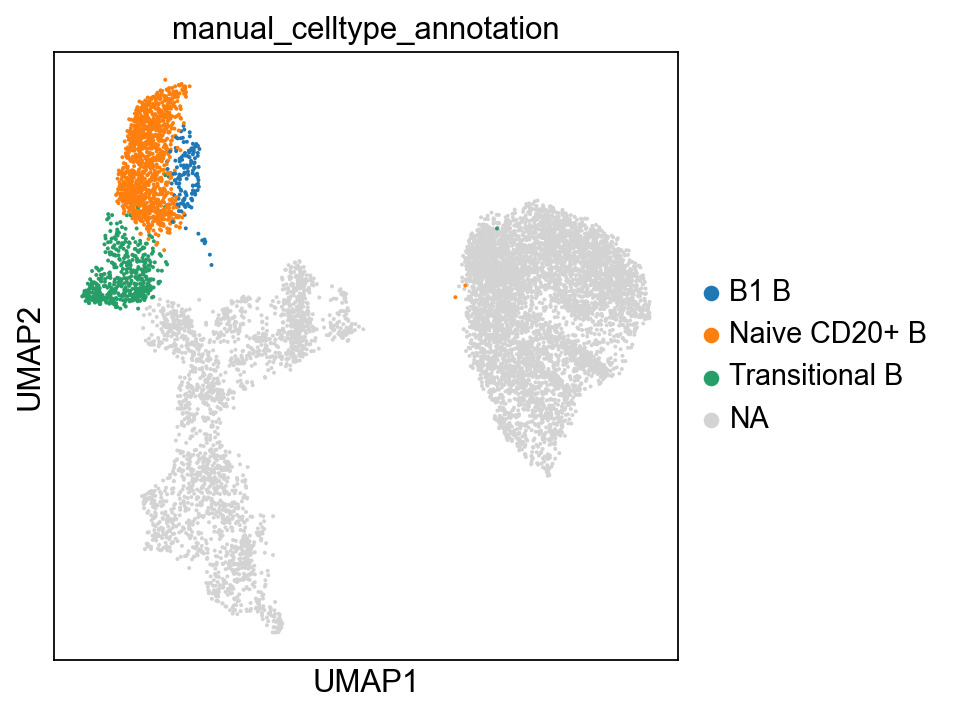

In [16]:
cl_annotation = {
    "5": "Naive CD20+ B",
    "6": "Naive CD20+ B",
    "8": "Transitional B",
    "19": "B1 B",  # note that IGHD and IGHM are negative markers, in this case more lowly expressed than in the other B cell clusters
}

adata.obs["manual_celltype_annotation"] = adata.obs.leiden_res2.map(cl_annotation)
sc.pl.umap(adata, color=["manual_celltype_annotation"])

### Using cluster differentially expressed genes to annotate clusters

From [Single cell best practices](https://www.sc-best-practices.org/cellular_structure/annotation.html#from-cluster-differentially-expressed-genes-to-cluster-annotation):

>Conversely, we can calculate marker genes per cluster and then look up whether we can link those marker genes to any known biology such as cell types and/or states. For marker gene calculation of clusters simple methods such as the Wilcoxon rank-sum test are thought to perform best [Pullin and McCarthy, 2022]. Importantly, as the definition of the clusters is based on the same data as used for these statistical tests, the p-values of these tests will be inflated as also described here [Zhang et al., 2019].



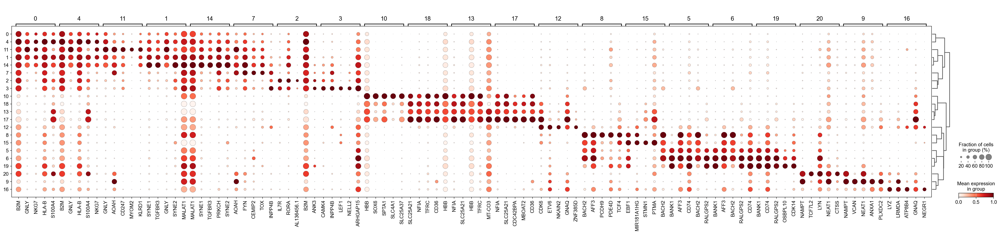

In [17]:
sc.tl.rank_genes_groups(
    adata, groupby="leiden_res2", method="wilcoxon", key_added="dea_leiden_2"
)

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res2", standard_scale="var", n_genes=5, key="dea_leiden_2"
)

In [18]:
#return the results in a dataframe
#https://scanpy.readthedocs.io/en/1.9.x/generated/scanpy.get.rank_genes_groups_df.html
sc.get.rank_genes_groups_df(adata, key="dea_leiden_2", group=None)

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,B2M,24.573387,1.129120,2.432823e-133,3.796177e-129
1,0,GNLY,16.465137,1.573237,6.531338e-61,2.911857e-57
2,0,NKG7,10.705724,1.394884,9.568030e-27,3.686408e-24
3,0,HLA-B,8.435935,0.483389,3.285660e-17,3.854845e-15
4,0,S100A4,7.260350,0.695730,3.860892e-13,2.613681e-11
...,...,...,...,...,...,...
655363,20,ATP8A1,-4.530591,-2.257345,5.881905e-06,1.653716e-03
655364,20,PRKCH,-4.726706,-2.427647,2.281918e-06,7.266743e-04
655365,20,LRBA,-5.192564,-1.959479,2.074176e-07,8.091359e-05
655366,20,PARP8,-5.412808,-2.368603,6.204402e-08,2.993574e-05


>As you can see above, a lot of the differentially expressed genes are highly expressed in multiple clusters. We can filter the differentially expressed genes to select for more cluster-specific differentially expressed genes. 

We can filter the genes by the minimum fraction of cells expressing the gene in a cluster vs the maximum fraction of cells expressing the gene in other clusters. 



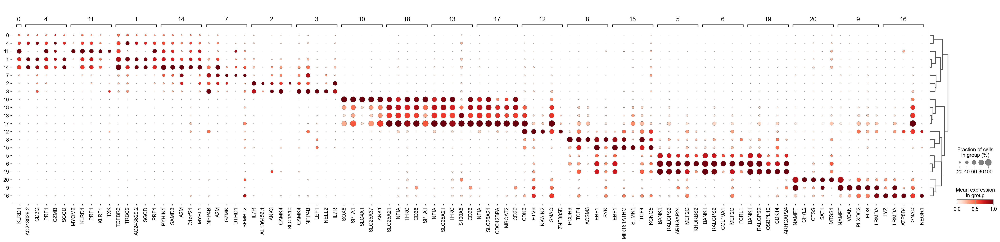

In [19]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_2",
    key_added="dea_leiden_2_filtered",
)

sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_res2",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_2_filtered",
)

>Let’s take a look at cluster 12, which seems to have a set of relatively unique markers including CDK6, ETV6, NKAIN2, and GNAQ. Some googling tells us that NKAIN2 and ETV6 are hematopoietic stem cell markers [Shi et al., 2022] [Wang et al., 1998] (NKAIN2 was also present in our list above). In the UMAP we can see that these genes are expressed throughout cluster 12:

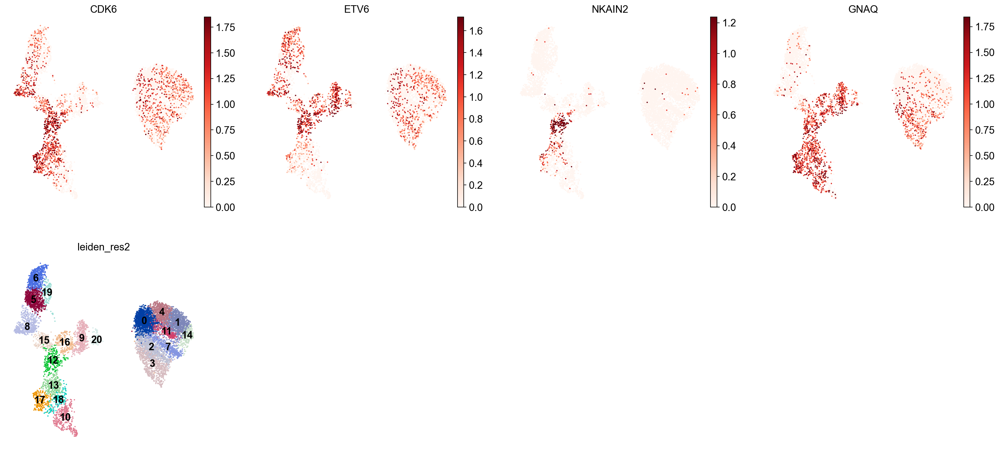

In [20]:
sc.pl.umap(
    adata,
    color=["CDK6", "ETV6", "NKAIN2", "GNAQ", "leiden_res2"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

You see that for cluster 12, some markers are expressed in other clusters as well. But looking collectively at the markers, they are all expressed throughout cluster 12.

However, looking at our manual marker list:

```
"MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1"]
```

Cluster 12 does also seem to be part of that group as well. 



You see that for cluster 12, some markers are expressed in other clusters as well. But looking collectively at the markers, they are all expressed throughout cluster 12.

However, looking at our manual marker list:

```
"MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1"]
```

Cluster 12 does also seem to be part of that group as well. 



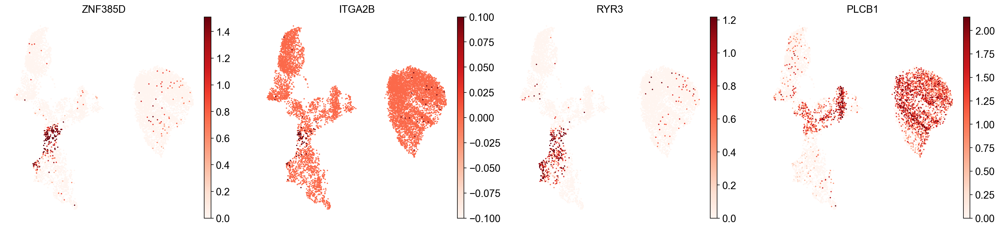

In [22]:
sc.pl.umap(
    adata,
    color=[
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

So you see here that marker for clusters is not straightforward. One one hand we have a marker set from manual curation /prior knowledge, the other based on differential expressed genes.  For this reason, the field is moving away from manual cluster annoation and using automated tools instead. 

In [23]:
cl_annotation["12"] = "HSCs + MK/E prog (?)"
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_res2.map(cl_annotation)


adata

AnnData object with n_obs × n_vars = 9370 × 31208
    obs: 'site', 'donor', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'DF_score', 'batch', 'size_factors', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'manual_celltype_annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'highly_variable'
    uns: 'pca', 'neighbors', 'umap', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors', 'leiden_res2_colors', 'manual_celltype_annota

## Automated annotation 

Notes taken from [Single cell best practices](https://www.sc-best-practices.org/cellular_structure/annotation.html#automated-annotation)

From the exercises above, manual automation first involves dimesionality reduction, clustering, and marker gene identification. It can be time consuming and subjective, and the resulting annotations are not always clear cut.

The field is moving towards automated annotation, which has it's own caveats. But it can be faster and more straightforward process.  The quality of the annotations depends on many things. From Single cell best practices:

>The type of classifier chosen: Previous benchmark studies have shown that different types of classifiers often perform comparably, with neural network-based methods generally not outperforming general-purpose models such as support vector machines or linear regression models[Abdelaal et al., 2019], [Pasquini et al., 2021], [Huang and Zhang, 2021].

>The quality of the data that the classifier was trained on. If the training data was not well annotated or annotated at low resolution, the classifier will do the same. Similarly, if the training data and/or its annotation was noisy, the classifier might not perform well.

>The similarity of your own data to the data that the classifier was trained on. For example, if the classifier was trained on a drop-seq single cell dataset and your data is 10X single nucleus rather than single cell drop-seq, this might worsen the quality of the annotation. Classifiers trained on cross-dataset atlases including a diversity of datasets might give more robust and better quality annotations than classifiers trained on a single dataset. An example is the CellTypist (an automated annotation method that will be discussed more extensively below) classifier trained on the Human Lung Cell Atlas [Sikkema et al., 2023] which includes 14 different lung datasets. This model is likely to perform better on new lung data than a model that was trained on a single lung dataset.

That said, automated annotation doesn't involve clustering your data first, you can directly use the classifier to predict cell types by simply uploading your data. 

## CellTypist

>It is worth noting that the methods discussed so far use only a small subset of the genes detected in the data: often a set of only 1 to ~10 marker genes per cell type is used. An alternative approach is to use a classifier that takes as input a larger set of genes (several thousands or more), thereby making more use of the breadth of scRNA-seq data. Such classifiers are trained on previously annotated datasets or atlases. Examples of these are CellTypist [Conde et al., 2022] (see also https://www.celltypist.org, where data can be uploaded to a portal to get automated cell annotations) and Clustifyr [Fu et al., 2020].


>Let’s try out CellTypist on our data. Based on the CellTypist tutorial (https://www.celltypist.org/tutorials) we know we need to prepare our data so that counts are normalized to 10,000 counts per cell, then log1p-transformed:







In [24]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

## Download annotation model

The annotation models are pulled down as python pickle files. Pickle is a python serialization format. 



In [25]:
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

display(model_high.cell_types)
display(model_low.cell_types)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 50
📂 Storing models in /Users/indapa/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

### Running the models to annotate the data

Annotation is simply running the model on the data. Much easier than manual annotation, right?



In [26]:
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [27]:
predictions_high_adata = predictions_high.to_adata() # write to AnnData object

# copy the cell type labels and confidence scores to our original adata object
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[ 
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

In [28]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

predictions_low_adata = predictions_low.to_adata()

adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


### Plot the data from both models and compare

Next, we plot the data from both models and compare

... storing 'manual_celltype_annotation' as categorical


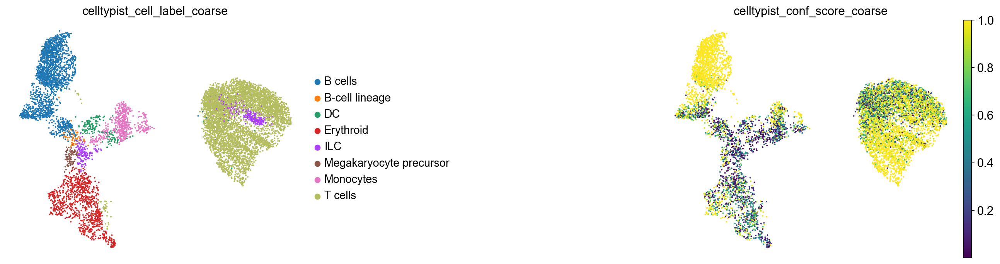

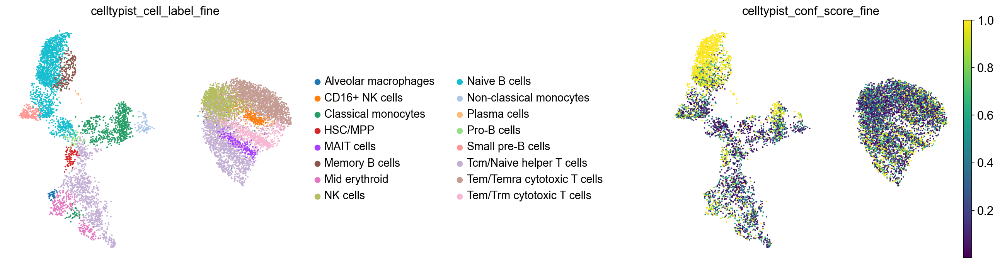

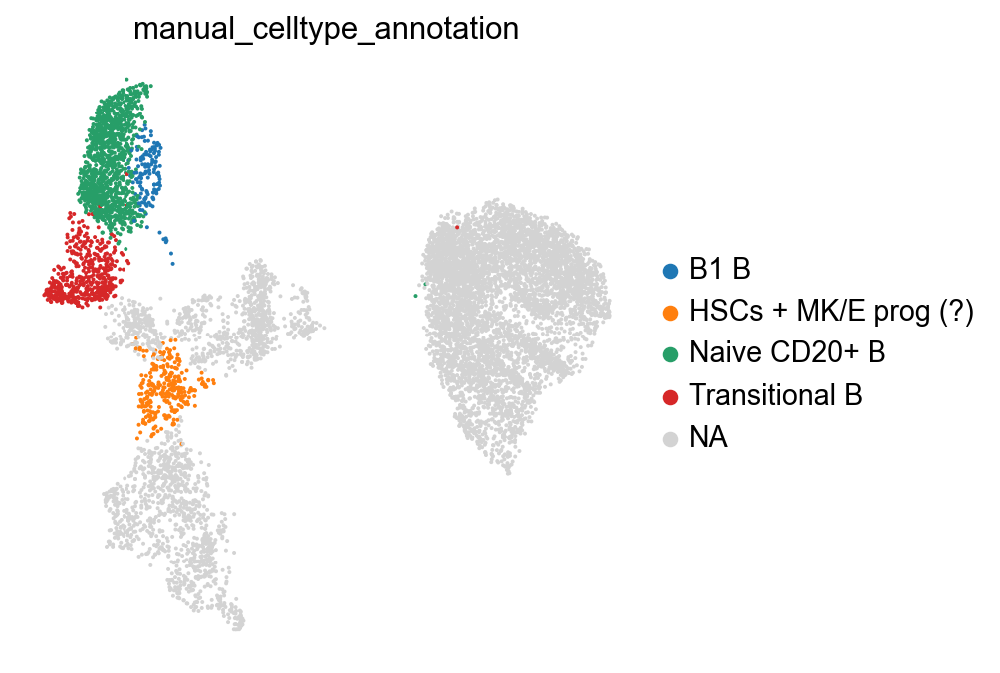

In [29]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

# plot the UMAP with the manual annotations

sc.pl.umap(
    adata,
    color=["manual_celltype_annotation"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

We see here the differences based on the coarse and fine models. It would be interesting to see how the annotations map onto the Cell Ontology (CL). Also, see how the annotations compare to manual annotations performed previously.

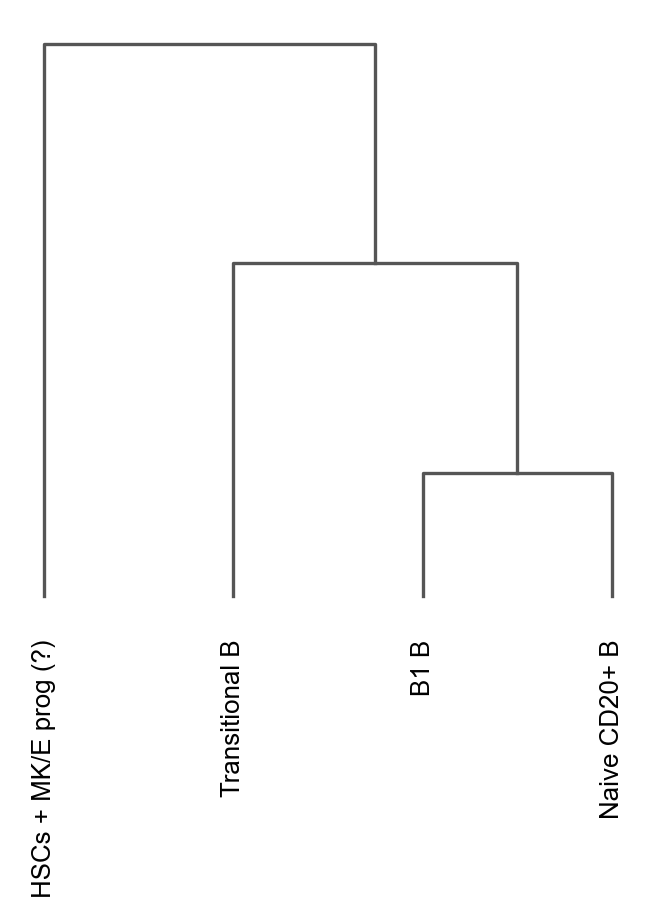

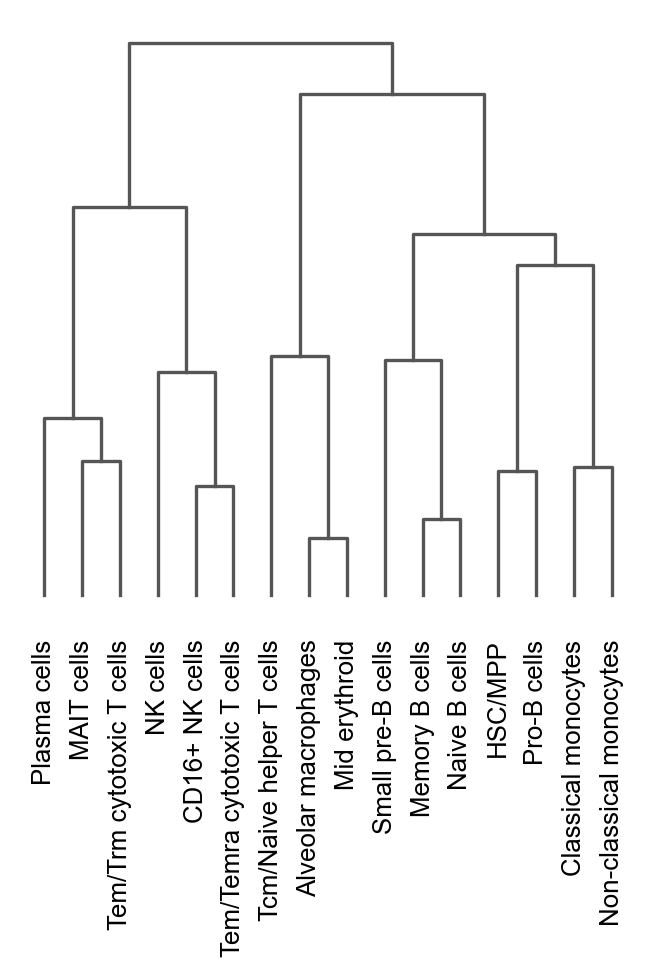

<Axes: >

In [30]:
sc.pl.dendrogram(adata, groupby="manual_celltype_annotation")
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")


Interesting that Tcm/Naive helper T cells cluster with erthroid and macrophages and not other T-cells. 

Comparing the manual with the fine model, the naive B cells match, which is good! 

However the HSC + MK/E cluster is annotated as a mixture of T cells and HSC cells in the fine model. From SC Best practices:

>However, you’ll also notice that our HSC + MK/E prog cluster is annotated as a mixture of T cells and HSCs/multipotent progenitors in their fine annotation, hence these annotations are partly contradictory. Looking at the confidence score of both annotations, we see that the annotation of the larger part of the cells is done with relatively low confidence, which is a useful indication that these annotations cannot be copied without careful validation and manual reviewing!

>See here the breakdown of cluster 12 in terms of fine celltypist labels:



In [31]:
pd.crosstab(adata.obs.leiden_res2, adata.obs.celltypist_cell_label_fine).loc[
    "12", :
].sort_values(ascending=False)

celltypist_cell_label_fine
Tcm/Naive helper T cells       151
HSC/MPP                         95
Pro-B cells                     42
Classical monocytes              5
Tem/Temra cytotoxic T cells      1
Alveolar macrophages             0
CD16+ NK cells                   0
MAIT cells                       0
Memory B cells                   0
Mid erythroid                    0
NK cells                         0
Naive B cells                    0
Non-classical monocytes          0
Plasma cells                     0
Small pre-B cells                0
Tem/Trm cytotoxic T cells        0
Name: 12, dtype: int64

In [32]:
pd.crosstab(adata.obs.leiden_res2, adata.obs.celltypist_cell_label_coarse).loc[
    "12", :
].sort_values(ascending=False)

celltypist_cell_label_coarse
ILC                        144
Megakaryocyte precursor     95
B-cell lineage              42
Erythroid                    7
Monocytes                    4
DC                           1
T cells                      1
B cells                      0
Name: 12, dtype: int64

>We therefore see that this automated annotation only partly corresponds to our manual annotations and is even contradictory between its own coarse and fine labels. Possible reasons for this failure were discussed above.
This underlines that automated annotation algorithms should be used with caution and should be regarded as a starting point for annotating your data, rather than as a final annotation. Ultimately, expression of known marker genes is still the most accepted support for a cell type annotation.

>To highlight this, let’s look at a marker for the erythroid lineage: hemoglobulin B. Most likely the cells annotated as “Tcm/Naive helper T” (already flagged as possibly wrongly annotated based on the dendrogram above) are from the erythroid lineage!


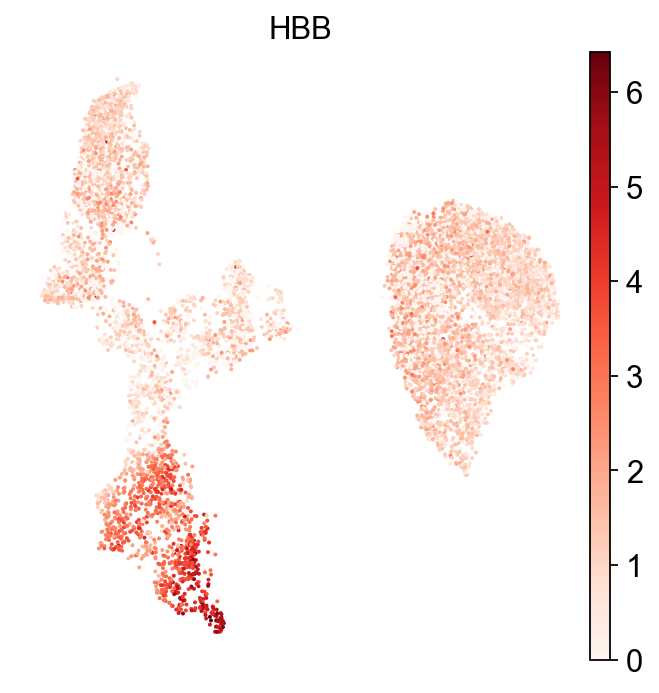

In [34]:
sc.pl.umap(adata, color="HBB", cmap="Reds", frameon=False, sort_order=False)